In [ ]:
## In this notebook, we will attempt to find the magnitude of nongravitational 
## acceleration for which heliolinc and link_purify will no longer recognize 
## a given object as a single body. 

In [2]:
## first, import the necessary modules

import os 
import sys
import numpy as np
import pandas as pd
import random
import subprocess
import sorcha
from astroquery.jplhorizons import Horizons
from astroquery.jplsbdb import SBDB

In [3]:
## define our filepaths and filename stems

## filepath for sorcha input and output files
sfpath = "/home/ellie/research/lsst/sorcha_output/2000_obj/"

## filename stems for the orbit files and other files
fname_orb = "2000_obj_orb"
fname_stem = "2000_obj"

## object ID
obj_id = "2000_obj"

## location of Sorcha config file
config_fpath = "Rubin_full_footprint.ini"

## location of pointing database file for Sorcha
pointing_db_path = "/home/ellie/src/sorcha/sorcha/demo/baseline_v2.0_1yr.db"

## location of Earth location file for HelioLinC
earth1day_path = '/home/ellie/research/lsst/heliolinc_files/Earth1day2020s_02a.csv'

## location of ObsCodes file for HelioLinC
obscodes_path = '/home/ellie/research/lsst/heliolinc_files/ObsCodes.html'

## location of colformat file for HelioLinC
colformat_path = '/home/ellie/research/lsst/heliolinc_files/colformat.txt'

## location of hypothesis file for HelioLinC
hypo_path = '/home/ellie/research/lsst/sorcha_output/127005pratchett_new/hihyp00b_mb.txt'

## location of kep2cart.py program
k2c_path = '/home/ellie/research/lsst/lsst_seti/nongrav/sorcha_ng'

## import the kep2cart module
kep_dir = os.path.abspath(k2c_path)
sys.path.insert(0, kep_dir)

from kep2cart import kep2cart as k2c

In [ ]:
## first, take a sample of objects and create the Kepler orbits file

## note -- spectral type, absolute magnitude, and the slope parameter can
## be obtained by querying JPL Horizons (H and G can also be obtained from
## the MPC)

## first, let's load in ../research/lsst/mpcorb_csvs/mpc_extended_complete.csv
## filter down to just MBAs, then choose, say, 10,000 objects at random

## then, loop through the 10,000 objects to find which ones have a 
## spectral classification in JPL Horizons

## once we have that filtered list, create the orbits file by querying
## the osculating orbital elements in JPL Horizons

## then, create the Physical Parameters file once I have confirmation of
## how to do this from Grigori

## note the table in the notebook Grigori sent uses the SMASSI classification system

In [4]:
## read in the MPC file we created awhile back:
df = pd.read_csv('/home/ellie/research/lsst/mpcorb_csvs/mpcorb_extended_complete_vel_2sept.csv')

/tmp/ipykernel_36119/1310468857.py:2: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/home/ellie/research/lsst/mpcorb_csvs/mpcorb_extended_complete_vel_2sept.csv')


In [5]:
main_belts = df.loc[df['Orbit_type'] == 'MBA']
main_belts = main_belts.reset_index(drop=True)
print("Number of MBAs: {}".format(len(main_belts)))

Number of MBAs: 472906


In [6]:
## select 2000 MBAs at random

min_n = 0
max_n = len(main_belts)-1
length = 2000
random.seed(42)

indices = [random.randint(min_n, max_n) for n in range(length)]
mba_sample = main_belts.loc[indices]
mba_sample = mba_sample.reset_index(drop=True)

In [7]:
## create a Keplerian orbits file for all of these objects...

## use MJD 62010.00 as our start date for querying the osculating elements
start_mjd = 62010.00
start_jd = start_mjd+2400000.5

ids = []
a = []
e = []
inc = []
node = []
arg_peri = []
ma = []

H = []
G = []

for i in range(len(mba_sample)):
    obj = Horizons(id=mba_sample['Principle_desig'][i], location='500@10',epochs=start_jd)
    el = obj.elements()
    #print(el['a'][0])

    id = el['targetname'][0].split()[0]    
    ids.append(id)
    
    a.append(float(el['a'][0]))
    e.append(float(el['e'][0]))
    inc.append(float(el['incl'][0]))
    node.append(float(el['Omega'][0]))
    arg_peri.append(float(el['w'][0]))
    ma.append(float(el['M'][0]))
    H.append(float(el['H'][0]))
    G.append(float(el['G'][0]))

    #print(f"we have processed {i+1} asteroids")

    if i%10 == 0:
        print(f"we have processed {i+1} asteroids")

df_mba = pd.DataFrame()

df_mba['ObjID'] = ids
df_mba['FORMAT'] = ['KEP']*len(mba_sample)
df_mba['a'] = a
df_mba['e'] = e
df_mba['inc'] = inc 
df_mba['node'] = node
df_mba['argPeri'] = arg_peri
df_mba['ma'] = ma
df_mba['epochMJD_TDB'] = [start_mjd]*len(mba_sample)

df_mba.to_csv('2000_obj_orb.csv', index=False)

df_phy = pd.DataFrame()
df_phy['ObjID'] = ids
df_phy['H'] = H
df_phy['G'] = G
df_phy.to_csv('2000_obj_H_and_G.csv', index=False)

we have processed 1 asteroids
we have processed 11 asteroids
we have processed 21 asteroids
we have processed 31 asteroids
we have processed 41 asteroids
we have processed 51 asteroids
we have processed 61 asteroids
we have processed 71 asteroids
we have processed 81 asteroids
we have processed 91 asteroids
we have processed 101 asteroids
we have processed 111 asteroids
we have processed 121 asteroids
we have processed 131 asteroids
we have processed 141 asteroids
we have processed 151 asteroids
we have processed 161 asteroids
we have processed 171 asteroids
we have processed 181 asteroids
we have processed 191 asteroids
we have processed 201 asteroids
we have processed 211 asteroids
we have processed 221 asteroids
we have processed 231 asteroids
we have processed 241 asteroids
we have processed 251 asteroids
we have processed 261 asteroids
we have processed 271 asteroids
we have processed 281 asteroids
we have processed 291 asteroids
we have processed 301 asteroids
we have processed 3

In [8]:
print(df_mba['argPeri'])

0       281.695321
1       269.085931
2         3.821532
3        72.544293
4        41.568813
           ...    
1995    326.541368
1996    233.859828
1997    178.422434
1998     83.208723
1999     77.947243
Name: argPeri, Length: 2000, dtype: float64


In [9]:
## create Sorcha inputs

k2c("{0}.csv".format(fname_orb), "{0}{1}_cart.csv".format(sfpath, fname_orb))

New Cartesian orbits file /home/ellie/research/lsst/sorcha_output/2000_obj/2000_obj_orb_cart.csv written.


In [10]:
## generate the nongravitational orbits files
nongravs = np.logspace(start=-12, stop=3, num=16, base=10) 

df = pd.read_csv("{0}{1}_cart.csv".format(sfpath, fname_orb))
df['FORMAT'] = 'NONGRAV'
df['a1'] = [0.0]*len(df)
df['a2'] = [0.0]*len(df)
df['a3'] = [0.0]*len(df)
df['model'] = 'ASTEROID'
epoch = df.pop('epochMJD_TDB')
df.insert(12, 'epochMJD_TDB', epoch)

orb_files = ["{0}{1}_cart.csv".format(sfpath, fname_orb)]

for i in range(len(nongravs)):
    df1 = df.copy()
    df1['a1'] = [nongravs[i]]*len(df)
    df1_fname = "{0}{1}_ng_a1_{2}.csv".format(sfpath, fname_orb, np.log10(nongravs[i]))
    df1.to_csv(df1_fname, index=False)

    df2 = df.copy()
    df2['a2'] = [nongravs[i]]*len(df)
    df2_fname = "{0}{1}_ng_a2_{2}.csv".format(sfpath, fname_orb, np.log10(nongravs[i]))
    df2.to_csv(df2_fname, index=False)

    df3 = df.copy()
    df3['a3'] = [nongravs[i]]*len(df)
    df3_fname = "{0}{1}_ng_a3_{2}.csv".format(sfpath, fname_orb, np.log10(nongravs[i]))
    df3.to_csv(df3_fname, index=False)

    orb_files.append(df1_fname)
    orb_files.append(df2_fname)
    orb_files.append(df3_fname)  

df_orbfiles = pd.DataFrame()
df_orbfiles['orb_files'] = orb_files

In [28]:
## generate Physical Parameters file using placeholder values
## (these are not the correct values, need to fix)

df_spec_V = pd.read_csv('colors_lut_V.csv', sep='\\s+')#'spectral_type_lut.csv')
df_spec = pd.read_csv('spectral_type_lut.csv')
u_mag = [df_spec['C'][0]]*len(df_mba)
g_mag = [df_spec['C'][1]]*len(df_mba)
r_mag = df_HG['H'] - [df_spec_V['V-r'][c_idx]]*len(df_mba)
i_mag = [df_spec['C'][3]]*len(df_mba)
z_mag = [df_spec['C'][4]]*len(df_mba)
y_mag = [df_spec['C'][5]]*len(df_mba)

#print(df_spec.head(5))

df_HG = pd.read_csv('2000_obj_H_and_G.csv')

df_phy = pd.DataFrame()
c_idx = df_spec_V[df_spec_V['spectral_type'] == 'C'].index[0]

df_phy['ObjID'] = df_mba['ObjID']
df_phy['H_r'] = df_HG['H'] - df_spec_V['V-r'][c_idx] ## note that we are setting the visual H mag as our V-mag now
df_phy['u-r'] = u_mag-r_mag
df_phy['g-r'] = g_mag-r_mag
df_phy['i-r'] = i_mag-r_mag
df_phy['z-r'] = z_mag-r_mag
df_phy['y-r'] = y_mag-r_mag
df_phy['GS'] = df_HG['G']

#df_phy['u-r'] = -df_spec['V-u'][c_idx]
#df_phy['g-r'] = -df_spec['V-g'][c_idx]
#df_phy['i-r'] = -df_spec['V-i'][c_idx]
#df_phy['z-r'] = -df_spec['V-z'][c_idx]
#df_phy['y-r'] = -df_spec['V-y'][c_idx]

print(df_phy.head(5))
df_phy.to_csv("{0}{1}_phy.csv".format(sfpath, fname_stem), index=False)

    ObjID        H_r        u-r        g-r        i-r        z-r        y-r  \
0  362629  16.433888 -14.749712 -15.964644 -16.550537 -16.555842 -16.560428   
1   71515  14.843888 -13.159712 -14.374644 -14.960537 -14.965842 -14.970428   
2   24186  14.813888 -13.129712 -14.344644 -14.930537 -14.935842 -14.940428   
3  419440  16.443888 -14.759712 -15.974644 -16.560537 -16.565842 -16.570428   
4  161190  14.783888 -13.099712 -14.314644 -14.900537 -14.905842 -14.910428   

     GS  
0  0.15  
1  0.15  
2  0.15  
3  0.15  
4  0.15  


In [29]:
## create a list of output filename stems for Sorcha

ofnames = []

for idx in range(len(orb_files)):

    ## define the output filename stem (no extension)
    ofname = orb_files[idx].replace("_orb", "") 
    ofname = ofname.split('/')[-1]
    ofname = ofname.split('.')[:-1]
    ofname = '.'.join(ofname)

    ofnames.append(ofname)

print(orb_files[0])
print(ofnames[0])

df_orbfiles['of_names'] = ofnames
df_orbfiles.to_csv('orb_files2.csv', index=False)

/home/ellie/research/lsst/sorcha_output/2000_obj/2000_obj_orb_cart.csv
2000_obj_cart


In [30]:
print(ofnames[:22])

['2000_obj_cart', '2000_obj_ng_a1_-12.0', '2000_obj_ng_a2_-12.0', '2000_obj_ng_a3_-12.0', '2000_obj_ng_a1_-11.0', '2000_obj_ng_a2_-11.0', '2000_obj_ng_a3_-11.0', '2000_obj_ng_a1_-10.0', '2000_obj_ng_a2_-10.0', '2000_obj_ng_a3_-10.0', '2000_obj_ng_a1_-9.0', '2000_obj_ng_a2_-9.0', '2000_obj_ng_a3_-9.0', '2000_obj_ng_a1_-8.0', '2000_obj_ng_a2_-8.0', '2000_obj_ng_a3_-8.0', '2000_obj_ng_a1_-7.0', '2000_obj_ng_a2_-7.0', '2000_obj_ng_a3_-7.0', '2000_obj_ng_a1_-6.0', '2000_obj_ng_a2_-6.0', '2000_obj_ng_a3_-6.0']


In [33]:
## run Sorcha on each file
lst = range(len(orb_files[:22]))
#print(lst[28:][0])

for i in lst:#range(len(orb_files)):
    print(orb_files[i])
    print(ofnames[i])
    subprocess.run(["sorcha","run","-c", config_fpath,"-p","{0}{1}_phy.csv".format(sfpath, fname_stem),"--orbits",\
                    orb_files[i],"--pd",pointing_db_path,"-o",sfpath,"-t",sfpath+ofnames[i],\
                    "--st","{0}{1}_stats".format(sfpath,ofnames[i]), '-f'])

    print('\n{0} out of {1} ({2} %) complete'.format(i+1, len(orb_files), 100*round((i+1)/len(orb_files), 2)))

/home/ellie/research/lsst/sorcha_output/2000_obj/2000_obj_orb_cart.csv
2000_obj_cart
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0

In [34]:
## shorten the Sorcha output to one month of detections, as heliolinc seems to balk
## at anything much longer, according to Aren
lst = range(len(orb_files[:22]))
arr = lst
out_fnames = []
missing = []
new_ofnames = []

for j in arr:

    if os.path.isfile("{0}{1}.csv".format(sfpath, ofnames[j])):
        ## insert logic to check if file exists -- if so, do the following
        ## (else, print "{fname} does not exist, skipping")
        df_sorcha = pd.read_csv("{0}{1}.csv".format(sfpath, ofnames[j]))
        start_date = df_sorcha['fieldMJD_TAI'][0]
        end_date = start_date+30

        df_sorcha_30d = df_sorcha[df_sorcha['fieldMJD_TAI'] <= end_date]
        df_sorcha_30d.to_csv("{0}{1}_30days.csv".format(sfpath, ofnames[j]), index=False)

        ## create an input file from the Sorcha
        ## output that is compatible with make_tracklets
        ## ( this same code can be found in 
        ## /lsst_seti/nongrav/heliolinc/create_maketracklets_input.py )
    
        fname = "{0}{1}_30days.csv".format(sfpath, ofnames[j])
        out_fname = "{0}{1}_30days_cmi.csv".format(sfpath, ofnames[j])

        df = pd.read_csv(fname)
        nrows = len(df['ObjID'])
        df['ObsCode'] = np.full((nrows, 1), 'I11')

        df.to_csv(out_fname, index=False)

        print(out_fname)
        out_fnames.append(out_fname)
        new_ofnames.append(ofnames[j])
        
    else:
        print("Warning: {0}{1}.csv does not exist.".format(sfpath, ofnames[j]))
        missing.append("{0}{1}.csv".format(sfpath, ofnames[j]))

df_missing = pd.DataFrame()
df_missing['missing_files'] = missing
df_missing.to_csv('missing_files.csv', index=False)

## reassign ofnames so it only includes non-missing files,
## to avoid issues later
ofnames = new_ofnames

/home/ellie/research/lsst/sorcha_output/2000_obj/2000_obj_cart_30days_cmi.csv
/home/ellie/research/lsst/sorcha_output/2000_obj/2000_obj_ng_a1_-12.0_30days_cmi.csv
/home/ellie/research/lsst/sorcha_output/2000_obj/2000_obj_ng_a2_-12.0_30days_cmi.csv
/home/ellie/research/lsst/sorcha_output/2000_obj/2000_obj_ng_a3_-12.0_30days_cmi.csv
/home/ellie/research/lsst/sorcha_output/2000_obj/2000_obj_ng_a1_-11.0_30days_cmi.csv
/home/ellie/research/lsst/sorcha_output/2000_obj/2000_obj_ng_a2_-11.0_30days_cmi.csv
/home/ellie/research/lsst/sorcha_output/2000_obj/2000_obj_ng_a3_-11.0_30days_cmi.csv
/home/ellie/research/lsst/sorcha_output/2000_obj/2000_obj_ng_a1_-10.0_30days_cmi.csv
/home/ellie/research/lsst/sorcha_output/2000_obj/2000_obj_ng_a2_-10.0_30days_cmi.csv
/home/ellie/research/lsst/sorcha_output/2000_obj/2000_obj_ng_a3_-10.0_30days_cmi.csv
/home/ellie/research/lsst/sorcha_output/2000_obj/2000_obj_ng_a1_-9.0_30days_cmi.csv
/home/ellie/research/lsst/sorcha_output/2000_obj/2000_obj_ng_a2_-9.0_30da

In [35]:
## run make_tracklets

for k in range(len(out_fnames)):

    subprocess.run(['make_tracklets', '-dets', out_fnames[k], '-earth', earth1day_path, \
                   '-obscode', obscodes_path, '-colformat', colformat_path,'-outimgs', \
                   '{0}outim_{1}.txt'.format(sfpath, ofnames[k]), \
                   '-pairdets', '{0}pairdets_{1}.csv'.format(sfpath, ofnames[k]),\
                   '-tracklets', '{0}tracklets_{1}.csv'.format(sfpath, ofnames[k]), \
                   '-trk2det', '{0}trk2det_{1}.csv'.format(sfpath, ofnames[k])])

Checking out argv[1] = -dets.
Checking out argv[3] = -earth.
Checking out argv[5] = -obscode.
Checking out argv[7] = -colformat.
Checking out argv[9] = -outimgs.
Checking out argv[11] = -pairdets.
Checking out argv[13] = -tracklets.
Checking out argv[15] = -trk2det.

Input detection file is called /home/ellie/research/lsst/sorcha_output/2000_obj/2000_obj_cart_30days_cmi.csv

No input image file specified: image catalog will be generated internally.
column formatting file = /home/ellie/research/lsst/heliolinc_files/colformat.txt
Observatory code file /home/ellie/research/lsst/heliolinc_files/ObsCodes.html
Output image file will be called /home/ellie/research/lsst/sorcha_output/2000_obj/outim_2000_obj_cart.txt
Output paired detection file will be called /home/ellie/research/lsst/sorcha_output/2000_obj/pairdets_2000_obj_cart.csv
Output tracklet file will be called /home/ellie/research/lsst/sorcha_output/2000_obj/tracklets_2000_obj_cart.csv
Output tracklet-to-detection mapping file will be

In [36]:
## run heliolinx

for l in range(len(ofnames)):

    subprocess.run(['heliolinc', '-imgs', '{0}outim_{1}.txt'.format(sfpath, ofnames[l]), \
                    '-pairdets', '{0}pairdets_{1}.csv'.format(sfpath, ofnames[l]), \
                    '-tracklets', '{0}tracklets_{1}.csv'.format(sfpath, ofnames[l]), \
                    '-trk2det', '{0}trk2det_{1}.csv'.format(sfpath, ofnames[l]), \
                    '-obspos', earth1day_path, '-heliodist', hypo_path, '-outsum',\
                    '{0}sum_{1}.csv'.format(sfpath, ofnames[l]), '-clust2det', \
                    '{0}clust2det_{1}.csv'.format(sfpath, ofnames[l])])

Checking out argv[1] = -imgs.
Checking out argv[3] = -pairdets.
Checking out argv[5] = -tracklets.
Checking out argv[7] = -trk2det.
Checking out argv[9] = -obspos.
Checking out argv[11] = -heliodist.
Checking out argv[13] = -outsum.
Checking out argv[15] = -clust2det.
input image file /home/ellie/research/lsst/sorcha_output/2000_obj/outim_2000_obj_cart.txt
input detection file /home/ellie/research/lsst/sorcha_output/2000_obj/pairdets_2000_obj_cart.csv
input tracklet file /home/ellie/research/lsst/sorcha_output/2000_obj/tracklets_2000_obj_cart.csv
input trk2det file /home/ellie/research/lsst/sorcha_output/2000_obj/trk2det_2000_obj_cart.csv
input observer position file /home/ellie/research/lsst/heliolinc_files/Earth1day2020s_02a.csv
input heliocentric hypothesis file /home/ellie/research/lsst/sorcha_output/127005pratchett_new/hihyp00b_mb.txt
input reference MJD 0
Defaulting to cluster radius = 100000km
Defaulting to min. geocentric distance for cluster scaling = 0.5AU
Minimum cluster rad

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



sis of geobin 7 identified 0 distinct candidate linkages. Current total is 0
Geocentric distance step 8, bin-center distance is 1.71 AU
KDRclust_6i01 finished clustering geobin 8, with 0 = 0 clusters found
Final analysis of geobin 8 identified 0 distinct candidate linkages. Current total is 0
Geocentric distance step 9, bin-center distance is 2.56 AU
Geocentric distance step 10, bin-center distance is 3.84 AU
Geocentric distance step 11, bin-center distance is 5.77 AU
Geocentric distance step 12, bin-center distance is 8.65 AU
Geocentric distance step 13, bin-center distance is 12.97 AU
Geocentric distance step 14, bin-center distance is 19.46 AU
Geocentric distance step 15, bin-center distance is 29.19 AU
Geocentric distance step 16, bin-center distance is 43.79 AU
Geocentric distance step 17, bin-center distance is 65.68 AU
Geocentric distance step 18, bin-center distance is 98.53 AU
Geocentric distance step 19, bin-center distance is 147.79 AU
Across all geobins, identified 0 total 

In [37]:
## run link_purify -- first, create the lflist file

for m in range(len(ofnames)):
    with open('{0}{1}_lflist'.format(sfpath, ofnames[m]), 'w') as f:
        f.write("{0}sum_{1}.csv {0}clust2det_{1}.csv".format(sfpath, ofnames[m]))
        f.close()

        ## now, actually run link_purify
        subprocess.run(['link_purify','-imgs','{0}outim_{1}.txt'.format(sfpath, ofnames[m]),\
                        '-pairdets','{0}pairdets_{1}.csv'.format(sfpath, ofnames[m]), \
                        '-lflist','{0}{1}_lflist'.format(sfpath, ofnames[m]),\
                        '-outsum','{0}LPLsum_{1}.csv'.format(sfpath, ofnames[m]),\
                        '-clust2det','{0}LPLclust2det_{1}.csv'.format(sfpath, ofnames[m])])

Checking out argv[1] = -imgs.
Checking out argv[3] = -pairdets.
Checking out argv[5] = -lflist.
Checking out argv[7] = -outsum.
Checking out argv[9] = -clust2det.
input paired detection file /home/ellie/research/lsst/sorcha_output/2000_obj/pairdets_2000_obj_cart.csv
input cluster list file /home/ellie/research/lsst/sorcha_output/2000_obj/2000_obj_cart_lflist
Maximum RMS in km: 100000
Maximum astrometric RMS: 1
Maximum fraction of points to be rejected: 0.5
Minimum number of observing nights: 3
Minimum number of unique detections: 6
output cluster file /home/ellie/research/lsst/sorcha_output/2000_obj/LPLclust2det_2000_obj_cart.csv
output rms file /home/ellie/research/lsst/sorcha_output/2000_obj/LPLsum_2000_obj_cart.csv
Reference MJD will be set to MJD-at-the-epoch from a previous orbit fit, if available.
Defaulting to simplex type = 1
Maximum fraction of points that can be rejected = 0.5, which is the default.
Maximum number of points that can be rejected = 50, which is the default.
Min

2000_obj_cart - 282
2000_obj_ng_a1_-12.0 - 280
2000_obj_ng_a2_-12.0 - 282
2000_obj_ng_a3_-12.0 - 281
2000_obj_ng_a1_-11.0 - 280
2000_obj_ng_a2_-11.0 - 283
2000_obj_ng_a3_-11.0 - 281
2000_obj_ng_a1_-10.0 - 280
2000_obj_ng_a2_-10.0 - 283
2000_obj_ng_a3_-10.0 - 283
2000_obj_ng_a1_-9.0 - 277
2000_obj_ng_a2_-9.0 - 281
2000_obj_ng_a3_-9.0 - 283
2000_obj_ng_a1_-8.0 - 287
2000_obj_ng_a2_-8.0 - 285
2000_obj_ng_a3_-8.0 - 283
2000_obj_ng_a1_-7.0 - 286
2000_obj_ng_a2_-7.0 - 289
2000_obj_ng_a3_-7.0 - 290
2000_obj_ng_a1_-6.0 - 278
2000_obj_ng_a2_-6.0 - 307
2000_obj_ng_a3_-6.0 - 335


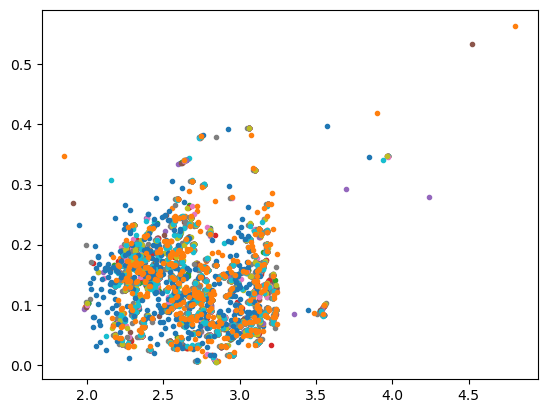

In [18]:
## how many linkages?
import pylab as plt

a1_links = []
a2_links = []
a3_links = []

for n in range(len(ofnames)):

    if os.path.isfile('{0}LPLsum_{1}.csv'.format(sfpath, ofnames[n])):
        df_links = pd.read_csv('{0}LPLsum_{1}.csv'.format(sfpath, ofnames[n]))
        num_links = len(df_links)

        print(ofnames[n]+' - '+str(num_links))
        plt.scatter(df_links['orbit_a'], df_links['orbit_e'], marker='.')
    else:
        print('{0}LPLsum_{1}.csv does not exist'.format(sfpath, ofnames[n]))

plt.show()

In [37]:
## need to add code here to check two things: 

## a. Do all the tracklets in a linkage correspond to the same object?
## b. Does one object ID appear in multiple linkages? 

## We can do this by tracing back through the make_tracklets, heliolinc, and link_purify output to link
## the cluster numbers back to the image numbers and thus to the object IDs

## there is clearly something wrong with my methods -- probably an issue with establishing
## the connection between cluster numbers and object ids. Anyway clearly something is 
## incorrect here, the number of successful linkages is too small and the trend makes no
## sense at all. 

## first, get correspondence between cluster number and detection number 
a1_links = []
a2_links = []
a3_links = []

n=0
prev_ids = []

for n in range(len(ofnames)):

    if os.path.isfile('{0}LPLsum_{1}.csv'.format(sfpath, ofnames[n])):
        df_links = pd.read_csv('{0}LPLsum_{1}.csv'.format(sfpath, ofnames[n]))
        df_ctd = pd.read_csv('{0}LPLclust2det_{1}.csv'.format(sfpath, ofnames[n]))
        df_trk2det = pd.read_csv('{0}trk2det_{1}.csv'.format(sfpath, ofnames[n]))
        df_trks = pd.read_csv('{0}tracklets_{1}.csv'.format(sfpath, ofnames[n]))
        df_pairs = pd.read_csv('{0}pairdets_{1}.csv'.format(sfpath, ofnames[n]))
        
        i=0
        linkages = 0
        ## loop over each cluster
        for i in range(len(df_links)):
            ## for a given cluster, identify the corresponding detections
            cluster_num = df_links['#clusternum'][i]
            #print(cluster_num)
            dets = df_ctd['detnum'][df_ctd['#clusternum'] == cluster_num].values
            #print(dets)

            ## find the tracklet corresponding to each detection
            trks = df_trk2det['#trk_ID'][df_trk2det['detnum'].isin(dets)].values
            #print(trks)

            ## find the "images" associated with each detection
            im1s = df_trks['#Image1'][df_trks['trk_ID'].isin(trks)].values
            im2s = df_trks['Image2'][df_trks['trk_ID'].isin(trks)].values

            imgs = im1s+im2s
            #print(im1s)
            #print(im2s)
            
            ## find the object id associated with each image
            ids = df_pairs['idstring'][df_pairs['image'].isin(imgs)].values
            #print(ids)
        
            ## check if the list of object ids contains more than one id or if all are the same
            unique_ids = np.unique(ids)
            if len(ids) == len(unique_ids):
                
                #print("No duplicates! Good to go")
                ## then check if any of the unique ids are in the accumulated ids
                ## from previous clusters 
                if len(prev_ids) != 0:
                    if len(list(set(ids) & set(prev_ids))) == 0:
                        #print("No intersections! Good to go")
                        linkages += 1
                        prev_ids = prev_ids+unique_ids.tolist()
                        continue
                        
                    else:
                        #print("Found an intersection, rejecting cluster")
                        prev_ids = prev_ids+unique_ids.tolist()
                        continue
                else:
                    #print("No previous ids yet, skipping")
                    linkages += 1 
                    prev_ids = prev_ids+unique_ids.tolist()
                    continue
                        
            else:
                #print("Duplicate found, rejecting cluster")
                prev_ids = prev_ids+unique_ids.tolist()
                continue 

        if 'cart' in ofnames[n]:
            print(ofnames[n]+' - '+str(linkages))
            gravonly = linkages
        else:
            print(ofnames[n]+' - '+str(linkages/gravonly))
        
    else:
        print('{0}LPLsum_{1}.csv does not exist'.format(sfpath, ofnames[n]))

2000_obj_cart - 54
2000_obj_ng_a1_-12.0 - 0.7962962962962963
2000_obj_ng_a2_-12.0 - 0.7777777777777778
2000_obj_ng_a3_-12.0 - 0.7962962962962963
2000_obj_ng_a1_-11.0 - 0.7962962962962963
2000_obj_ng_a2_-11.0 - 0.8148148148148148
2000_obj_ng_a3_-11.0 - 0.7407407407407407
2000_obj_ng_a1_-10.0 - 0.7592592592592593
2000_obj_ng_a2_-10.0 - 0.7777777777777778
2000_obj_ng_a3_-10.0 - 0.8518518518518519
2000_obj_ng_a1_-9.0 - 0.8148148148148148
2000_obj_ng_a2_-9.0 - 0.8703703703703703
2000_obj_ng_a3_-9.0 - 0.8333333333333334
2000_obj_ng_a1_-8.0 - 0.8888888888888888
2000_obj_ng_a2_-8.0 - 0.9074074074074074
2000_obj_ng_a3_-8.0 - 0.7222222222222222
2000_obj_ng_a1_-7.0 - 0.8148148148148148
2000_obj_ng_a2_-7.0 - 0.9814814814814815
2000_obj_ng_a3_-7.0 - 0.9444444444444444
2000_obj_ng_a1_-6.0 - 0.7777777777777778
2000_obj_ng_a2_-6.0 - 1.1851851851851851
2000_obj_ng_a3_-6.0 - 1.7962962962962963


In [1]:
## code to check if a given asteroid has a specified spectral class
## may not actually use this

mba_names = mba_sample['Principle_desig'].to_numpy()
indices_specb = []

for i in range(len(mba_names)):
    ast_name = mba_names[i]
    obj = SBDB.query(ast_name, phys=True) 

    try:
        spec_B = obj['phys_par']['spec_B']
        indices_specb.append(i)
        print(f"{mba_names[i]} has a spectral type, adding to list: {i+1}/{len(mba_names)}")

    except KeyError:
        print(f"{mba_names[i]} does not have a spectral type, skipping")

print(len(indices_specb))

NameError: name 'mba_sample' is not defined

In [64]:
print(len(indices_specb))

810
